In [1]:
# Useful starting lines
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
%load_ext autoreload
%autoreload 2

In [2]:
# Check the Python version
import sys
if sys.version.startswith("3."):
  print("You are running Python 3. Good job :)")
else:
  print("This notebook requires Python 3.\nIf you are using Google Colab, go to Runtime > Change runtime type and choose Python 3.")

You are running Python 3. Good job :)


In [3]:
try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False
if IN_COLAB:
  # Clone the entire repo to access the files.
  !git clone -l -s https://github.com/epfml/OptML_course.git cloned-repo
  %cd cloned-repo/labs/ex02/template/

# Load the data

In [4]:
import datetime
from helpers import *

height, weight, gender = load_data(sub_sample=False, add_outlier=False)
x, mean_x, std_x = standardize(height)
b, A = build_model_data(x, weight)

In [5]:
print('Number of samples n = ', b.shape[0])
print('Dimension of each sample d = ', A.shape[1])

Number of samples n =  10000
Dimension of each sample d =  2


# Least Squares Estimation
Least squares estimation is one of the fundamental machine learning algorithms. Given an $ n \times d $ matrix $A$ and a $ n \times 1$ vector $b$, the goal is to find a vector $x \in \mathbb{R}^d$ which minimizes the objective function $$f(x) = \frac{1}{2n} \sum_{i=1}^{n} (a_i^\top x - b_i)^2 = \frac{1}{2n} \|Ax - b\|^2 $$

In this exercise, we will try to fit $x$ using Least Squares Estimation. 

One can see the function is $L$ smooth with $L =\frac1n\|A^T A\|  = \frac1n\|A\|^2$ (Lemma 2.3 for the first equality, and a few manipulations for the second).

# Computing the Objective Function
Fill in the `calculate_objective` function below:

In [6]:
def calculate_objective(Axmb):
    """Calculate the mean squared error for vector Axmb = Ax - b."""
    dim = Axmb.shape[0]
    return Axmb.T @ Axmb / (2 * dim)
    raise NotImplementedError

# Compute smoothness constant $L$

To compute the spectral norm of A you can use np.linalg.norm(A, 2)

In [7]:
def calculate_L(b, A):
    """Calculate the smoothness constant for f"""
    L = A.T @ A
    L = np.linalg.norm(L, ord = 2)
    # TODO: compute ||A.T*A||
    L = L / A.shape[1]
    # TODO: compute L = smoothness constant of f

    return L

# Gradient Descent

Please fill in the functions `compute_gradient` below:

In [8]:
def compute_gradient(b, A, x):
    dim = A.shape[1]
    grad = A.T @ (A @ x - b) / (2 * dim)
    Axmb = A @ x - b
    """Compute the gradient."""
    # ***************************************************
    # INSERT YOUR CODE HERE
    # TODO: compute gradient and objective
    # ***************************************************
    
    return grad, Axmb

Please fill in the functions `gradient_descent` below:

In [9]:
def gradient_descent(b, A, initial_x, max_iters, gamma):
    """Gradient descent algorithm."""
    # Define parameters to store x and objective func. values
    xs = [initial_x]
    objectives = []
    x = initial_x
    for n_iter in range(max_iters):
        # ***************************************************
        # INSERT YOUR CODE HERE
        grad, obj = compute_gradient(b, A, x)
        # ***************************************************
        # INSERT YOUR CODE HERE
        x = x - gamma * grad
        # TODO: update x by a gradient descent step
        # ***************************************************
        
        # store x and objective function value
        xs.append(x)
        objectives.append(obj)
        print("Gradient Descent({bi}/{ti}): objective={l}".format(
              bi=n_iter, ti=max_iters - 1, l=obj))

    return objectives, xs

Test your gradient descent function with a naive step size through gradient descent demo shown below:

In [10]:
# from gradient_descent import *
from plots import gradient_descent_visualization

# Define the parameters of the algorithm.
max_iters = 50

gamma = 0.1

# Initialization
x_initial = np.zeros(A.shape[1])

# Start gradient descent.
start_time = datetime.datetime.now()
gradient_objectives_naive, gradient_xs_naive = gradient_descent(b, A, x_initial, max_iters, gamma)
end_time = datetime.datetime.now()

# Print result
exection_time = (end_time - start_time).total_seconds()
print("Gradient Descent: execution time={t:.3f} seconds".format(t=exection_time))

Gradient Descent(0/49): objective=[-109.81967768  -73.68895452  -96.58434842 ...  -58.32779473  -74.38901745
  -51.59669261]
Gradient Descent(1/49): objective=[24765.00829392 20364.54503814 25008.685926   ... 16075.75113376
 20584.87184485 14397.44945353]
Gradient Descent(2/49): objective=[-6169067.15663466 -5068755.71913589 -6226203.6124042  ...
 -4001309.90205997 -5123571.08286849 -3583415.04093536]
Gradient Descent(3/49): objective=[1.53609514e+09 1.26212219e+09 1.55032566e+09 ... 9.96327718e+08
 1.27577126e+09 8.92271895e+08]
Gradient Descent(4/49): objective=[-3.82487693e+11 -3.14268423e+11 -3.86031088e+11 ... -2.48085600e+11
 -3.17667042e+11 -2.22175700e+11]
Gradient Descent(5/49): objective=[9.52394355e+13 7.82528374e+13 9.61217409e+13 ... 6.17733144e+13
 7.90990935e+13 5.53217494e+13]
Gradient Descent(6/49): objective=[-2.37146194e+16 -1.94849565e+16 -2.39343135e+16 ... -1.53815553e+16
 -1.96956743e+16 -1.37751156e+16]
Gradient Descent(7/49): objective=[5.90494024e+18 4.8517541

Time Visualization

In [11]:
from ipywidgets import IntSlider, interact
from grid_search import *

def plot_figure(n_iter):
    # Generate grid data for visualization (parameters to be swept and best combination)
    grid_x0, grid_x1 = generate_w(num_intervals=10)
    grid_objectives = grid_search(b, A, grid_x0, grid_x1)
    obj_star, x0_star, x1_star = get_best_parameters(grid_x0, grid_x1, grid_objectives)
    
    fig = gradient_descent_visualization(
        gradient_objectives_naive, gradient_xs_naive, grid_objectives, grid_x0, grid_x1, mean_x, std_x, height, weight, n_iter)
    fig.set_size_inches(10.0, 6.0)

interact(plot_figure, n_iter=IntSlider(min=1, max=len(gradient_xs_naive)))

interactive(children=(IntSlider(value=1, description='n_iter', max=51, min=1), Output()), _dom_classes=('widge…

<function __main__.plot_figure(n_iter)>

Try doing gradient descent with a better learning rate

In [12]:
# Define the parameters of the algorithm.
max_iters = 50

# ***************************************************
# INSERT YOUR CODE HERE
# TODO: a better learning rate using the smoothness of f
# ***************************************************
gamma = 1 / calculate_L(b, A)

# Initialization
x_initial = np.zeros(A.shape[1])

# Start gradient descent.
start_time = datetime.datetime.now()
gradient_objectives, gradient_xs = gradient_descent(b, A, x_initial, max_iters, gamma)
end_time = datetime.datetime.now()

# Print result
exection_time = (end_time - start_time).total_seconds()
print("Gradient Descent: execution time={t:.3f} seconds".format(t=exection_time))

Gradient Descent(0/49): objective=[-109.81967768  -73.68895452  -96.58434842 ...  -58.32779473  -74.38901745
  -51.59669261]
Gradient Descent(1/49): objective=[-60.07002174 -32.81248654 -46.37380787 ... -26.05963687 -33.07049573
 -22.69860032]
Gradient Descent(2/49): objective=[-35.19519377 -12.37425255 -21.2685376  ...  -9.92555794 -12.41123486
  -8.24955418]
Gradient Descent(3/49): objective=[-22.75777978  -2.15513555  -8.71590246 ...  -1.85851848  -2.08160443
  -1.0250311 ]
Gradient Descent(4/49): objective=[-16.53907279   2.95442295  -2.43958489 ...   2.17500125   3.08321078
   2.58723043]
Gradient Descent(5/49): objective=[-13.42971929   5.5092022    0.69857389 ...   4.19176112   5.66561839
   4.3933612 ]
Gradient Descent(6/49): objective=[-11.87504255   6.78659182   2.26765328 ...   5.20014105   6.95682219
   5.29642659]
Gradient Descent(7/49): objective=[-11.09770417   7.42528663   3.05219298 ...   5.70433102   7.6024241
   5.74795928]
Gradient Descent(8/49): objective=[-10.7090

Time visualization with a better learning rate

In [13]:
def plot_figure(n_iter):
    # Generate grid data for visualization (parameters to be swept and best combination)
    grid_x0, grid_x1 = generate_w(num_intervals=10)
    grid_objectives = grid_search(b, A, grid_x0, grid_x1)
    obj_star, x0_star, x1_star = get_best_parameters(grid_x0, grid_x1, grid_objectives)
    
    fig = gradient_descent_visualization(
        gradient_objectives, gradient_xs, grid_objectives, grid_x0, grid_x1, mean_x, std_x, height, weight, n_iter)
    fig.set_size_inches(10.0, 6.0)

interact(plot_figure, n_iter=IntSlider(min=1, max=len(gradient_xs)))

interactive(children=(IntSlider(value=1, description='n_iter', max=51, min=1), Output()), _dom_classes=('widge…

<function __main__.plot_figure(n_iter)>

# Loading more complex data
The data is taken from https://archive.ics.uci.edu/ml/datasets/Concrete+Compressive+Strength 

In [14]:
data = np.loadtxt("Concrete_Data.csv",delimiter=",")

A = data[:,:-1]
b = data[:,-1]
A, mean_A, std_A = standardize(A)

In [15]:
print('Number of samples n = ', b.shape[0])
print('Dimension of each sample d = ', A.shape[1])

Number of samples n =  1030
Dimension of each sample d =  8


# Running gradient descent

## Assuming bounded gradients
Assume we are moving in a bounded region $\|x\| \leq 25$ containing all iterates (and we assume $\|x-x^\star\| \leq 25$ as well, for simplicity). Then by $\nabla f(x) = \frac{1}{n}A^\top (Ax - b)$, one can see that $f$ is Lipschitz over that bounded region, with Lipschitz constant $\|\nabla f(x)\| \leq \frac{1}{n} (\|A^\top A\|\|x\| + \|A^\top b\|)$

In [16]:
# ***************************************************
# INSERT YOUR CODE HERE
# TODO: Compute the bound on the gradient norm
# ***************************************************
bound_x = 2
dim = b.shape[0]
grad_norm_bound = (np.linalg.norm(A.T @ A, ord = 2) * bound_x + np.linalg.norm(A.T @ b)) / dim

Fill in the learning rate assuming bounded gradients

In [17]:
max_iters = 50

# ***************************************************
# INSERT YOUR CODE HERE
# TODO: Compute learning rate based on bounded gradient
# ***************************************************
gamma = bound_x / (grad_norm_bound * np.sqrt(max_iters))

# Initialization
x_initial = np.zeros(A.shape[1])

# Start gradient descent.
start_time = datetime.datetime.now()
bd_gradient_objectives, bd_gradient_xs = gradient_descent(b, A, x_initial, max_iters, gamma)
end_time = datetime.datetime.now()


# Print result
exection_time = (end_time - start_time).total_seconds()
print("Gradient Descent: execution time={t:.3f} seconds".format(t=exection_time))

# Averaging the iterates as is the case for bounded gradients case
bd_gradient_objectives_averaged = []
for i in range(len(bd_gradient_xs)):
    if i > 0:
        bd_gradient_xs[i] = (i * bd_gradient_xs[i-1] + bd_gradient_xs[i])/(i + 1)
    grad, err = compute_gradient(b, A, bd_gradient_xs[i])
    obj = calculate_objective(err)
    bd_gradient_objectives_averaged.append(obj)

Gradient Descent(0/49): objective=[-79.99 -61.89 -40.27 ... -23.7  -32.77 -32.4 ]
Gradient Descent(1/49): objective=[-59.58645902 -42.02090918 -22.45515011 ... -35.65071648 -34.14355583
 -33.12140108]
Gradient Descent(2/49): objective=[-64.8531748  -46.93481092 -15.72504072 ... -32.52715057 -34.09792502
 -34.99251281]
Gradient Descent(3/49): objective=[-63.51976761 -45.73788108 -23.11510595 ... -33.24738596 -34.093258
 -35.15461113]
Gradient Descent(4/49): objective=[-61.94129992 -44.10100046 -12.4481414  ... -33.32486395 -35.45789535
 -35.35507984]
Gradient Descent(5/49): objective=[-63.62844136 -45.83631357 -26.42243007 ... -32.71927612 -34.96153057
 -35.75519439]
Gradient Descent(6/49): objective=[-60.39566759 -42.56505398  -8.3085676  ... -33.44892059 -36.65691036
 -35.50873787]
Gradient Descent(7/49): objective=[-63.96345677 -46.17514895 -31.80535923 ... -32.36016199 -35.4020215
 -36.15071885]
Gradient Descent(8/49): objective=[-58.80318958 -40.95546656  -1.47470618 ... -33.675278

## Gradient descent using smoothness
Fill in the learning rate using smoothness of the function

In [18]:
max_iters = 50


# ***************************************************
# INSERT YOUR CODE HERE
# TODO: a better learning rate using the smoothness of f
# ***************************************************
gamma = 1 / calculate_L(b, A)


# Initialization
x_initial = np.zeros(A.shape[1])

# Start gradient descent.
start_time = datetime.datetime.now()
gradient_objectives, gradient_xs = gradient_descent(b, A, x_initial, max_iters, gamma)
end_time = datetime.datetime.now()

# Print result
exection_time = (end_time - start_time).total_seconds()
print("Gradient Descent: execution time={t:.3f} seconds".format(t=exection_time))

Gradient Descent(0/49): objective=[-79.99 -61.89 -40.27 ... -23.7  -32.77 -32.4 ]
Gradient Descent(1/49): objective=[-75.53999075 -57.55655425 -36.38458389 ... -26.30644948 -33.06957232
 -32.55733747]
Gradient Descent(2/49): objective=[-72.3110526  -54.40197462 -33.02644168 ... -28.19585236 -33.30163742
 -32.76936385]
Gradient Descent(3/49): objective=[-69.96839731 -52.10575391 -30.22706439 ... -29.56447381 -33.48134359
 -33.00642138]
Gradient Descent(4/49): objective=[-68.26463333 -50.43011885 -27.93826844 ... -30.55562199 -33.62354087
 -33.24927442]
Gradient Descent(5/49): objective=[-67.01930092 -49.20106854 -26.08652279 ... -31.27339214 -33.7405965
 -33.48605363]
Gradient Descent(6/49): objective=[-66.10191792 -48.29243642 -24.59666725 ... -31.79315611 -33.84196122
 -33.70992896]
Gradient Descent(7/49): objective=[-65.41872019 -47.6133207  -23.40118476 ... -32.16939342 -33.93444008
 -33.91741836]
Gradient Descent(8/49): objective=[-64.90263008 -47.09852271 -22.44288612 ... -32.4414

## Plotting the Evolution of the Objective Function

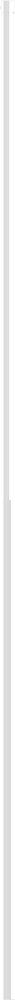

In [19]:
plt.figure(figsize=(8, 8))
plt.xlabel('Number of steps')
plt.ylabel('Objective Function')
#plt.yscale("log")
plt.plot(range(len(gradient_objectives)), gradient_objectives,'r', label='gradient descent with 1/L stepsize')
plt.plot(range(len(bd_gradient_objectives)), bd_gradient_objectives,'b', label='gradient descent assuming bounded gradients')
plt.plot(range(len(bd_gradient_objectives_averaged)), bd_gradient_objectives_averaged,'g', label='gradient descent assuming bounded gradients with averaged iterates')
plt.legend(loc='upper right')
plt.show()